# SPACEc: Clustering - GUI assisted

After preprocessing the single cell data, the next step is to assign cell types. One of the most common approaches to identify cell types is unsupervised or semi-unsupervised clustering. SPACEc utilizes the widely used scanpy library or pyFlowSOM to carry out this task. The user can specify different clustering resolutions as well as the number of nearest neighbors to modify the number of identified clusters. The flexible design of SPACEc allows for the selection of unique clustering strategies, dependent on the research question and available dataset. 

If you work with very large datasets consider using the GPU accelerated leiden clustering. Check our GitHub page for installation instructions.

This notebook utilizes the scanpy library for clustering and visualization.

In [2]:
# import spacec first
import spacec as sp

#import standard packages
import os
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

# silencing warnings
import warnings
warnings.filterwarnings('ignore')

plt.rc('axes', grid=False)  # remove gridlines
sc.settings.set_figure_params(dpi=80, facecolor='white') # set dpi and background color for scanpy figures

In [2]:
# Specify the path to the data
root_path = "/home/user/path/SPACEc/" # inset your own path
data_path = root_path + 'example_data/raw/' # where the data is stored

# where you want to store the output
output_dir = root_path + 'example_data/output/'
os.makedirs(output_dir, exist_ok=True)

In [4]:
# Loading the denoise/filtered anndata from notebook 2
adata = sc.read(output_dir + 'adata_nn_demo.h5ad')
adata # check the adata

AnnData object with n_obs × n_vars = 51138 × 58
    obs: 'DAPI', 'x', 'y', 'area', 'region_num', 'unique_region', 'condition'

## Clustering via GUI

The SPACEc clustering GUI gives access to the same features as our standard approach for manual clustering described in notebook 3_clustering. Therefore users should consider the same common remarks:
Before you start to annotate your cells try to develop a clustering strategy. Common approaches include to start with a coarse annotation such as immune cell, tumor cell, etc. and then refine the clusters. Another common strategy is to overcluster your dataset and then remerge split populations. Depending on your dataset you will often find yourself to use a mixed approach. Best practice is to start clustering with a set of markers that best describes your cell types. Functional markers such as PD1 should therefore be used later if you refine your clusters. 
An example set of markers could look like this:

'FoxP3', 'HLA-DR', 'EGFR', 'CD206', 'BCL2', 'panCK', 'CD11b', 'CD56', 'CD163', 'CD21', 'CD8', 
'Vimentin', 'CCR7', 'CD57', 'CD34', 'CD31', 'CXCR5', 'CD3', 'CD38', 'LAG3', 'CD25', 'CD16', 'CLEC9A', 'CD11c', 
'CD68', 'aSMA', 'CD20', 'CD4','Podoplanin', 'CD15', 'betaCatenin', 'PAX5', 
'MCT', 'CD138', 'GranzymeB', 'IDO-1', 'CD45', 'CollagenIV', 'Arginase-1'

If an anndata object and output directory are defined, they can be automatically loaded into the clustering GUI.

In [ ]:
sp.tl.launch_interactive_clustering(adata=adata, 
                                    output_dir=output_dir)

Alternatively, the user can indicate the file paths after launching the GUI.

NOTE: During development we observed that the GUI does sometimes not work as expected if executed in VScode. If this is the case for you consider launching it in Jupyter Lab. 

In [4]:
sp.tl.launch_interactive_clustering()

Row(design=<class 'panel.theme.bootst..., sizing_mode='stretch_both')
    [0] Tabs(design=<class 'panel.theme.bootst...)
        [0] Column(design=<class 'panel.theme.bootst...)
            [0] Markdown(str, design=<class 'panel.theme.bootst...)
            [1] Row(design=<class 'panel.theme.bootst...)
                [0] TextInput(design=<class 'panel.theme.bootst..., name='AnnData File Path', placeholder='Enter path to ....)
                [1] TextInput(design=<class 'panel.theme.bootst..., name='Output Directory', placeholder='Enter output d...)
                [2] Button(button_type='primary', design=<class 'panel.theme.bootst..., name='Load Data')
            [2] Divider(design=<class 'panel.theme.bootst...)
            [3] Markdown(str, design=<class 'panel.theme.bootst...)
            [4] Row(design=<class 'panel.theme.bootst...)
                [0] Select(design=<class 'panel.theme.bootst..., name='Clustering Method', options=['leiden', 'louvain', ...], value='leiden')
                [1] FloatInput(design=<class 'panel.theme.bootst..., name='Resolution', value=1.0)
                [2] IntInput(design=<class 'panel.theme.bootst..., name='Number of Neighbors', value=10)
            [5] Row(design=<class 'panel.theme.bootst...)
                [0] IntInput(design=<class 'panel.theme.bootst..., name='Random Seed', value=42)
                [1] Checkbox(design=<class 'panel.theme.bootst..., name='Reclustering')
            [6] Row(design=<class 'panel.theme.bootst...)
                [0] IntInput(design=<class 'panel.theme.bootst..., name='FlowSOM xdim', value=10)
                [1] IntInput(design=<class 'panel.theme.bootst..., name='FlowSOM ydim', value=10)
                [2] IntInput(design=<class 'panel.theme.bootst..., name='FlowSOM rlen', value=10)
            [7] TextInput(design=<class 'panel.theme.bootst..., name='Key Added', placeholder='Enter key to a...)
            [8] MultiChoice(design=<class 'panel.theme.bootst..., name='Marker List', width=950)
            [9] Divider(design=<class 'panel.theme.bootst...)
            [10] Row(design=<class 'panel.theme.bootst...)
                [0] Button(button_type='primary', design=<class 'panel.theme.bootst..., name='Run Clustering')
                [1] Progress(active=False, bar_color='primary', design=<class 'panel.theme.bootst..., name='Clustering Progress')
            [11] Markdown(None, design=<class 'panel.theme.bootst...)
        [1] Column(design=<class 'panel.theme.bootst...)
            [0] Markdown(str, design=<class 'panel.theme.bootst...)
            [1] Row(design=<class 'panel.theme.bootst...)
                [0] TextInput(design=<class 'panel.theme.bootst..., name='Subcluster Key', placeholder='Enter key to filter on (e...)
                [1] TextInput(design=<class 'panel.theme.bootst..., name='Subcluster Values', placeholder='Enter clusters t...)
                [2] FloatInput(design=<class 'panel.theme.bootst..., name='Subcluster Resolution', value=0.3)
            [2] Divider(design=<class 'panel.theme.bootst...)
            [3] Row(design=<class 'panel.theme.bootst...)
                [0] Button(button_type='primary', design=<class 'panel.theme.bootst..., name='Run Subclustering')
                [1] Progress(active=False, bar_color='primary', design=<class 'panel.theme.bootst..., name='Subclustering Progress')
            [4] Markdown(None, design=<class 'panel.theme.bootst...)
        [2] Column(design=<class 'panel.theme.bootst...)
            [0] Markdown(str, design=<class 'panel.theme.bootst...)
            [1] DataFrame(autosize_mode='fit_columns', design=<class 'panel.theme.bootst..., name='Cluster Annotations', value=Empty DataFrame
Columns: [...)
            [2] Divider(design=<class 'panel.theme.bootst...)
            [3] Button(button_type='success', design=<class 'panel.theme.bootst..., name='Save Annotations')
            [4] Markdown(None, design=<class 'panel.theme.bootst...)
        [3] Column(design=<class 'panel.theme.boots

The image below shows a screenshot of the clustering GUI. Users navigate the GUI through tabs. After the initial clustering, users can select clusters to be subclustered. Visualizations are added as tabs to the right. After successful clustering users can annotate the clusters as a table and check the results via spatial visualization of the tissue coordinates. Annotations are saved in the column 'cell_types'. The column name can be changed later in the anndata object. 

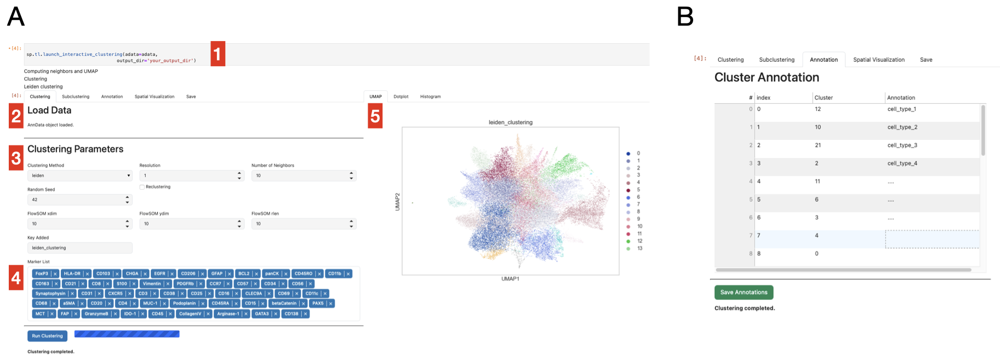

A) Screen shot of clustering app main interface. (1) The app can be launched directly from an Jupyter notebook using a single line of code. (2) If the user specifies the anndata object and output directory in the launch command they are directly loaded, alternatively the user can provide the app with file paths. The tab panel at the top provides easy access to all functions within the app. (3) The main view shows the user input parameters. Users can easily navigate through the available options using the drop down menus. (4) Markers can be selected by name and clustering is started as soon as the user has adjusted the settings and hits the start button. (5) All generated plots are shown in the plotting area on the right side of the screen. Each plot is saved as separate tab to easily navigate between the plots. B) Once clustering and sub-clustering are performed and the user is satisfied with the cluster separation, clusters can be annotated via a user-friendly table view. Annotations are saved under the key cell_type.

## Single-cell visualzation

After annotating the cells, the anndata object can be loaded for further analysis or visualization. 

In [ ]:
# load the adata object with the annoated clusters
adata = sc.read(output_dir + 'adata.h5ad')
adata # check the adata

In [94]:
# list of cell types
adata.obs['cell_type'].value_counts()

cell_type
B cell             15402
CD4+ T cell         9563
Epithelial cell     4522
DC                  3500
CD8+ T cell         2727
GCB                 2512
Plasma cell         2330
Vessel              2298
M1 Macrophage       2042
M2 Macrophage       1727
Treg                1195
cDC1                1048
Mast cell            354
NK cell              135
Name: count, dtype: int64

In [95]:
cell_type_colors = {
    'B cell' : '#1f77b4',           
    'CD4+ T cell' : '#ff7f0e',        
    'DC' : '#2ca02c',                
    'Vessel' : '#d62728',           
    'Epithelial cell' : '#9467bd',     
    'CD8+ T cell' : '#041f1e',     
    'GCB' : '#321325',               
    'Plasma cell' : '#5f0f40',      
    'M2 Macrophage' : '#bcbd22',     
    'Treg' : '#7f7f7f',            
    'cDC1' : '#17becf',             
    'M1 Macrophage' : '#e377c2',   
    'Mast cell' : '#f7dba7',          
    'NK cell' : '#000009',             
    'Neutrophil' : '#0ff4c6',           
    'PMN' : '#8c564b',                
}

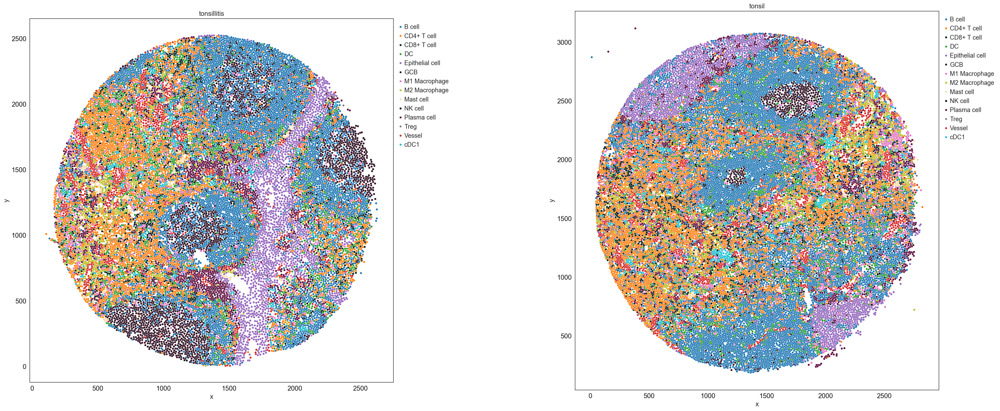

In [96]:
sp.pl.catplot(
    adata, 
    color = "cell_type", # specify group column name here (e.g. celltype_fine)
    unique_region = "condition", # specify unique_regions here
    X='x', Y='y', # specify x and y columns here
    n_columns=2, # adjust the number of columns for plotting here (how many plots do you want in one row?)
    palette=cell_type_colors, #default is None which means the color comes from the anndata.uns that matches the UMAP
    savefig=False, # save figure as pdf
    output_fname = "", # change it to file name you prefer when saving the figure
    output_dir=output_dir, # specify output directory here (if savefig=True)
    figsize= 17,
    size = 20)

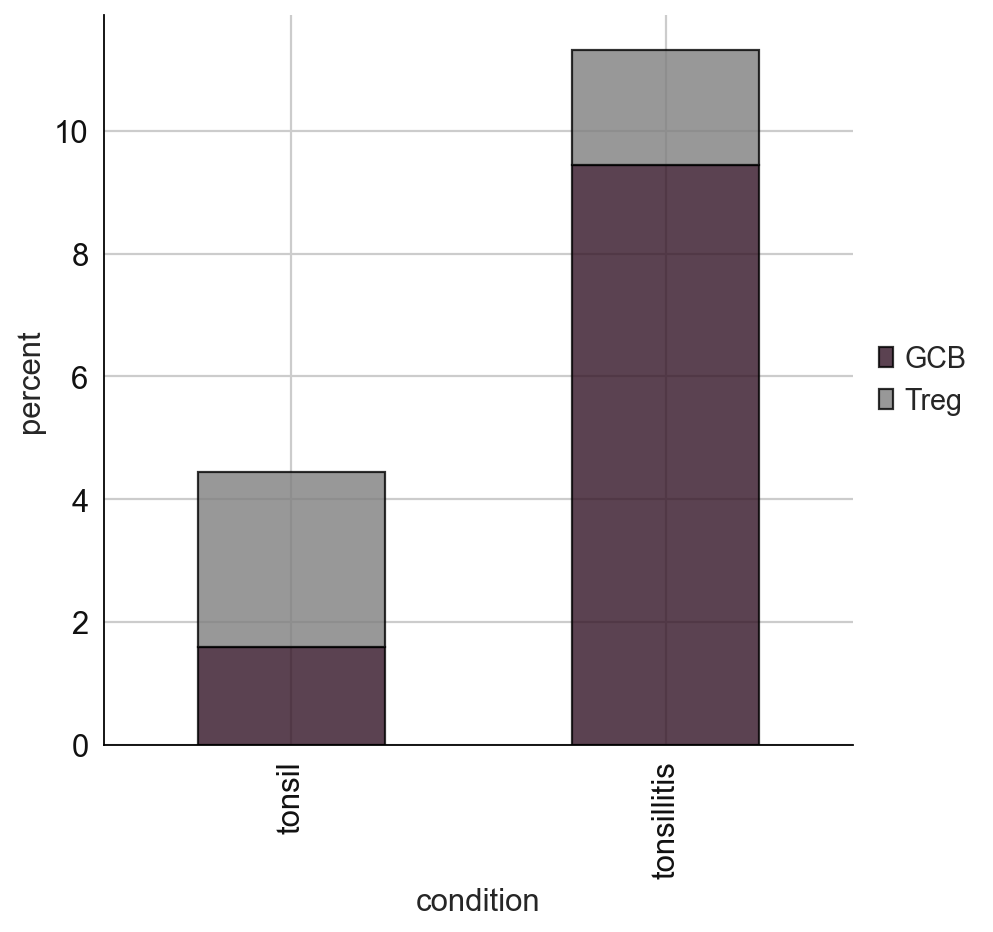

In [97]:
# cell type percentage tab and visualization [much few]
ct_perc_tab, _ = sp.pl.stacked_bar_plot(
    adata = adata, # adata object to use 
    color = 'cell_type', # column containing the categories that are used to fill the bar plot
    grouping = 'condition', # column containing a grouping variable (usually a condition or cell group) 
    cell_list = ['GCB', 'Treg'],  # list of cell types to plot, you can also see the entire cell types adata.obs['celltype_fine'].unique()
    palette=cell_type_colors, #default is None which means the color comes from the anndata.uns that matches the UMAP
    savefig=False, # change it to true if you want to save the figure
    output_fname = "", # change it to file name you prefer when saving the figure
    output_dir = output_dir, #output directory for the figure
    norm = False, # if True, then whatever plotted will be scaled to sum of 1
    fig_sizing= (6,6)
)

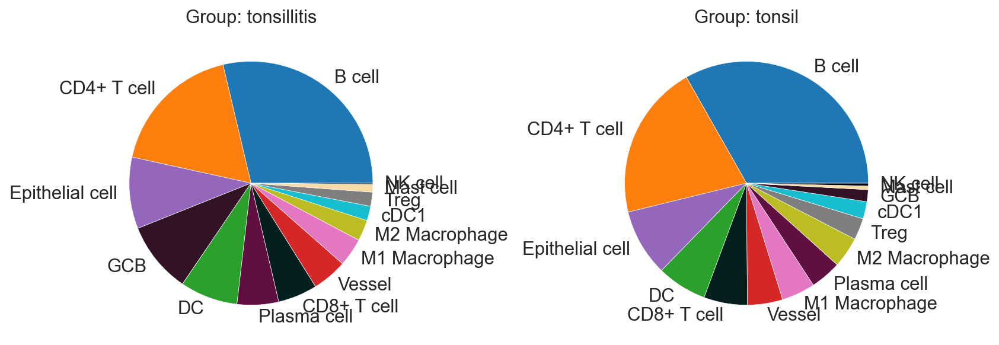

In [98]:
sp.pl.create_pie_charts(
    adata,
    color = "cell_type", 
    grouping = "condition", 
    show_percentages=False,
    palette=cell_type_colors, #default is None which means the color comes from the anndata.uns that matches the UMAP
    savefig=False, # change it to true if you want to save the figure
    output_fname = "", # change it to file name you prefer when saving the figure
    output_dir = output_dir #output directory for the figure
)